# Lecture 08a — Bands, indices, and the reflectance trap

**AI-integrated Sustainable Finance (25881) · Lecture 8 lab, part 1 of 2**

Last week's lecture argued that every carbon number in finance comes from one of three
regimes: *reported*, *modelled*, or *observed*. This notebook is about the third one. By the
end of it you will have taken a real satellite scene, turned it into the features that carbon
analytics is built on, and — more importantly — broken those features in two specific ways so
that you recognise the failure when you meet it in someone else's work.

**What you will do**

1. Choose an area of interest anywhere on Earth, or use one of ours.
2. Find and load a Sentinel-2 scene over it.
3. Convert stored integers to surface reflectance, and see exactly what goes wrong if you don't.
4. Mask cloud and shadow.
5. Compute sixteen spectral indices and read the feature space they define.
6. Break three of them on purpose.

**What this notebook is not.** It is not a remote-sensing course. Every step here exists
because it changes a number that ends up in a valuation.

## How this notebook gets data

There are three paths, tried in order. You do not have to choose; the notebook falls through.

| Path | What it needs | What you get |
|---|---|---|
| **Live** | Network access to `earth-search.aws.element84.com` | A real Sentinel-2 scene over the area you pick |
| **Mirrored** | The teaching repository | A pinned scene, identical for everyone, reproducible forever |
| **Synthetic** | Nothing at all | A generated scene with four land-cover types |

The synthetic path is not a consolation prize. It has one property the real data lacks: we
know the true answer, so we can test whether an index does what it claims. We use it
deliberately in section 6.

**Running this**: Google Colab, a local Anaconda environment, or the university JupyterHub.
No account, no API key, no credentials anywhere.

In [1]:
# --- dependencies ----------------------------------------------------------
# Checked against the teaching environment `Python2026_31314` on 1 September
# 2026: numpy, pandas, matplotlib, geopy and ipywidgets are already there; the
# geospatial stack is not. This cell tells you exactly what to run. It does not
# install anything for you unless you are on Colab.
import importlib, sys

REQUIRED = {"numpy": "numpy", "pandas": "pandas", "matplotlib": "matplotlib",
            "xarray": "xarray", "rasterio": "rasterio", "rioxarray": "rioxarray",
            "pystac_client": "pystac-client", "odc.stac": "odc-stac"}
OPTIONAL = {"geopy": "geopy", "ipyleaflet": "ipyleaflet"}

def _missing(d):
    out = []
    for mod, pkg in d.items():
        try:
            importlib.import_module(mod)
        except Exception:
            out.append(pkg)
    return out

need, nice_to_have = _missing(REQUIRED), _missing(OPTIONAL)
IN_COLAB = "google.colab" in sys.modules

if need and IN_COLAB:
    import subprocess
    print("Colab detected. Installing:", " ".join(need))
    subprocess.run([sys.executable, "-m", "pip", "install", "--quiet", *need], check=False)
    print("Done. If imports still fail, restart the runtime and re-run.")
elif need:
    print("Missing required packages:", " ".join(need))
    print()
    print("  Anaconda :  conda install -c conda-forge " + " ".join(need))
    print("  pip      :  pip install " + " ".join(need))
    print()
    print("Install, restart the kernel, then re-run this cell.")
else:
    print("All required packages present.")

if nice_to_have:
    print(f"Optional (the notebook works without them): {' '.join(nice_to_have)}")


All required packages present.


In [2]:
# The lab helper module. If it isn't beside this notebook, fetch it from the
# teaching repository. Everything below imports from it, so nothing in this
# notebook depends on a package that may not be installed.
import os, sys, pathlib

HELPER = "esgsat.py"
REPO_RAW = ("https://raw.githubusercontent.com/VitaliAlexeev/"
            "AI_SustainableFinance_2026/main/helpers/esgsat.py")

if not pathlib.Path(HELPER).exists():
    try:
        import urllib.request
        urllib.request.urlretrieve(REPO_RAW, HELPER)
        print(f"Downloaded {HELPER} from the teaching repository.")
    except Exception as exc:
        print(f"Could not download {HELPER}: {type(exc).__name__}: {exc}")
        print("Place esgsat.py beside this notebook and re-run this cell.")
else:
    print(f"Using local {HELPER}.")

Using local esgsat.py.


In [4]:
import warnings
import numpy as np
import matplotlib.pyplot as plt

import esgsat as E

# --- configuration ---------------------------------------------------------
USE_LIVE = True     # try the network first; set False to force the offline path
HEAVY    = False    # True loads 10 m bands over a larger area; slower, BUT prettier
RESOLUTION_M = 20 if not HEAVY else 10

np.seterr(divide="ignore", invalid="ignore")
plt.rcParams["figure.dpi"] = 110
print(f"esgsat loaded. {len(E.BANDS)} Sentinel-2 L2A bands, "
      f"{len(E.INDEX_REGISTRY)} indices registered.")

esgsat loaded. 12 Sentinel-2 L2A bands, 16 indices registered.


## 1. Choose an area

Three ways to do this, in increasing order of effort.

- **A preset.** Six areas chosen because they show something: a fire ground, a reservoir, a
  steelworks, an open-cut coal region, a city, and a mangrove delta.
- **A place name.** Geocoded, if you have network access.
- **Coordinates.** Always works.

The default is Warragamba, because it puts water, forest, and cleared land in one scene, and
because it supplies about 80 per cent of Sydney's drinking water — which makes it an asset
with a balance sheet behind it.

In [5]:
# --- pick your area -------------------------------------------------------
# Option A: a preset
AOI_NAME = "warragamba"          # try: sydney, blue-mountains, port-kembla,
                                 #      hunter-valley, sundarbans
HALF_WIDTH_KM = 12.0

# Option B: a place name (needs network). Set to None to skip.
PLACE = None                     # e.g. "Newcastle, New South Wales"

# Option C: explicit coordinates. Set to None to skip. (lon, lat)
POINT = None                     # e.g. (150.60, -33.89)

for name, (lon, lat, km, note) in E.PRESET_AOIS.items():
    print(f"  {name:16s} ({lon:7.2f}, {lat:7.2f})  {note}")

  sydney           ( 151.21,  -33.87)  Sydney metropolitan area
  warragamba       ( 150.60,  -33.89)  Warragamba Dam and Lake Burragorang
  blue-mountains   ( 150.30,  -33.70)  Blue Mountains, 2019-20 fire ground
  port-kembla      ( 150.90,  -34.47)  Port Kembla steelworks and port
  hunter-valley    ( 150.90,  -32.55)  Hunter Valley open-cut coal
  sundarbans       (  88.95,   22.02)  Sundarbans mangroves, blue carbon


In [6]:
if POINT is not None:
    BBOX = E.bbox_from_point(*POINT, HALF_WIDTH_KM)
    aoi_label = f"{POINT[0]:.3f}, {POINT[1]:.3f}"
elif PLACE is not None:
    BBOX = E.bbox_from_place(PLACE, HALF_WIDTH_KM, use_network=USE_LIVE)
    aoi_label = PLACE
else:
    BBOX = E.bbox_from_place(AOI_NAME, HALF_WIDTH_KM, use_network=False)
    aoi_label = E.PRESET_AOIS[AOI_NAME][3]

w, s, e, n = BBOX
print(f"Area of interest : {aoi_label}")
print(f"Bounding box     : W {w:.4f}  S {s:.4f}  E {e:.4f}  N {n:.4f}")
print(f"Approx. extent   : {2 * HALF_WIDTH_KM:.0f} km across")

Area of interest : Warragamba Dam and Lake Burragorang
Bounding box     : W 150.4698  S -33.9981  E 150.7302  N -33.7819
Approx. extent   : 24 km across


### An optional interactive map

If `ipyleaflet` is available, the cell below draws the box you just defined. It is a
convenience, not a dependency: if the widget stack is missing or your JupyterHub blocks it,
the notebook carries on with the coordinates above. This is the pattern to copy in your own
work — **never let a display library become a hard dependency of an analysis.**

In [7]:
try:
    from ipyleaflet import Map, Rectangle
    from IPython.display import display
    centre = ((s + n) / 2, (w + e) / 2)
    m = Map(center=centre, zoom=10)
    m.add_layer(Rectangle(bounds=((s, w), (n, e)), color="#123F69", fill_opacity=0.1))
    display(m)
except Exception as exc:
    print(f"Interactive map unavailable ({type(exc).__name__}). "
          f"Carrying on with the bounding box printed above.")

Map(center=[-33.89, np.float64(150.6)], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_ti…

In [9]:
#In case the above code cell fails... do the following:
try:
    import folium
    from IPython.display import display

    centre = ((s + n) / 2, (w + e) / 2)
    m = folium.Map(location=list(centre), zoom_start=10)
    folium.Rectangle(
        bounds=[[s, w], [n, e]],
        color="#123F69",
        fill=True,
        fill_opacity=0.1
        ).add_to(m)
    display(m)
except Exception as exc:
    print(f"Interactive map unavailable ({type(exc).__name__}). "
          f"Carrying on with the bounding box printed above.")

## 2. Find a scene

A STAC search asks: *what imagery exists over this box, in this date range, with less than
this much cloud?* It returns metadata, not pixels. Nothing is downloaded yet.

Note the cloud filter. `eo:cloud_cover` is a **scene-level** percentage, so a scene reported
at 8 per cent cloud can still be entirely clouded over your particular 12 km box. Scene-level
cloud cover is a search convenience, not a quality guarantee. We check properly in section 7.

In [15]:
DATE_START, DATE_END = "2024-01-01", "2024-12-31"
MAX_CLOUD = 20.0 # play around with this number try 5%, 25, 50, 100%! 

items, SCENE_SOURCE = [], "synthetic"
if USE_LIVE:
    try:
        items = E.search_scenes(BBOX, DATE_START, DATE_END, max_cloud=MAX_CLOUD)
        SCENE_SOURCE = "live" if items else "synthetic"
    except Exception as exc:
        print(f"Live search unavailable ({type(exc).__name__}: {exc}).")
        print("Falling back to the synthetic scene. Everything below still runs.")

if items:
    print(f"Found {len(items)} scenes. The five least cloudy:\n")
    for it in items[:5]:
        p = it.properties
        print(f"  {p['datetime'][:10]}   cloud {p.get('eo:cloud_cover', float('nan')):5.1f}%   {it.id}")
    
    print(f"\n...and now, the list of all {len(items)} scenes:\n")
    for it in items[:len(items)]:
        p = it.properties
        print(f"  {p['datetime'][:10]}   cloud {p.get('eo:cloud_cover', float('nan')):5.1f}%   {it.id}")
else:
    print("No live scenes. SCENE_SOURCE = 'synthetic'.")

Found 27 scenes. The five least cloudy:

  2024-12-24   cloud   0.0%   S2A_T56HKH_20241224T000222_L2A
  2024-10-30   cloud   0.0%   S2B_T56HKH_20241030T000431_L2A
  2024-06-27   cloud   0.1%   S2A_T56HKH_20240627T000434_L2A
  2024-05-28   cloud   0.2%   S2A_T56HKH_20240528T000453_L2A
  2024-04-23   cloud   0.4%   S2B_T56HKH_20240423T000221_L2A

...and now, the list of all 27 scenes:

  2024-12-24   cloud   0.0%   S2A_T56HKH_20241224T000222_L2A
  2024-10-30   cloud   0.0%   S2B_T56HKH_20241030T000431_L2A
  2024-06-27   cloud   0.1%   S2A_T56HKH_20240627T000434_L2A
  2024-05-28   cloud   0.2%   S2A_T56HKH_20240528T000453_L2A
  2024-04-23   cloud   0.4%   S2B_T56HKH_20240423T000221_L2A
  2024-12-29   cloud   0.7%   S2B_T56HKH_20241229T000223_L2A
  2024-01-29   cloud   0.8%   S2A_T56HKH_20240129T000216_L2A
  2024-08-21   cloud   1.0%   S2B_T56HKH_20240821T000557_L2A
  2024-09-20   cloud   1.0%   S2B_T56HKH_20240920T000216_L2A
  2024-09-10   cloud   1.3%   S2B_T56HKH_20240910T000223_L2A
  2

## 3. Load the bands

Whatever the source, the rest of the notebook sees the same thing: a dictionary keyed by
Sentinel-2 band identifier (`"B08"`), holding 2-D arrays of **stored integers**, plus the
scene classification layer under `"SCL"`.

Two details that cause more trouble than they should.

**Band order is not file order.** An alphabetical listing of band files sorts `B8A` *after*
`B12`. If you `glob` a directory and stack the result, band 9 of your array is `B09` but band
12 is `B8A`, and every index you compute downstream is quietly wrong. `esgsat.BANDS` fixes the
order explicitly and never infers it.

**Level-2A has twelve bands, not thirteen.** `B10` (cirrus) exists only in Level-1C.

In [17]:
BANDS_WANTED = ["B02", "B03", "B04", "B05", "B08", "B11", "B12"]

if SCENE_SOURCE == "live":
    ds = E.load_bands(items[0], BBOX, bands=BANDS_WANTED, resolution=RESOLUTION_M)
    scene = {b: ds[b].isel(time=0).values for b in BANDS_WANTED}
    scene["SCL"] = ds["scl"].isel(time=0).values
    scene_date = str(ds.time.values[0])[:10]
else:
    scene = E.demo_scene(size=320, as_dn=True, cloud=True)
    scene = {k: v for k, v in scene.items() if k in BANDS_WANTED + ["SCL"]}
    scene_date = "synthetic"

print(f"Source     : {SCENE_SOURCE}")
print(f"Date       : {scene_date}")
print(f"Bands      : {sorted(k for k in scene if k != 'SCL')}")
print(f"Shape      : {scene['B08'].shape}")
print(f"Dtype      : {scene['B08'].dtype}")
print(f"B08 range  : {int(np.nanmin(scene['B08']))} to {int(np.nanmax(scene['B08']))}")
print()
print("Those are stored integers, not reflectance. Section 6 is about what that means.")

Source     : live
Date       : 2024-12-24
Bands      : ['B02', 'B03', 'B04', 'B05', 'B08', 'B11', 'B12']
Shape      : (1228, 1234)
Dtype      : uint16
B08 range  : 737 to 8848

Those are stored integers, not reflectance. Section 6 is about what that means.


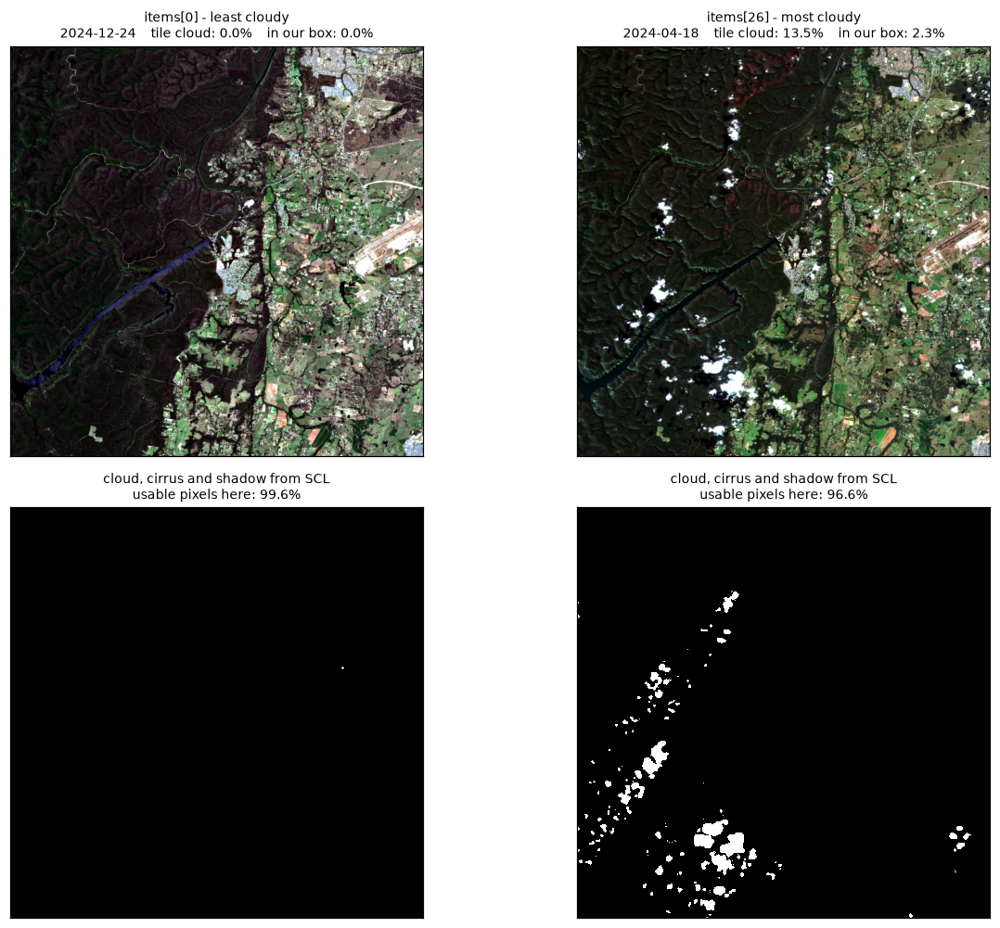

scene                        date          tile cloud   our box   usable
------------------------------------------------------------------------
items[0] - least cloudy      2024-12-24          0.0%      0.0%    99.6%
items[26] - most cloudy      2024-04-18         13.5%      2.3%    96.6%

Difference in the metadata figure : +13.5 percentage points
Difference over our bounding box  : +2.3 percentage points

Those two numbers describe different things. `eo:cloud_cover` is computed
over the whole ~110 km tile; the second is measured from the scene
classification layer over the few kilometres we actually loaded. Filter your
search on the first, but report and mask on the second.
  items[0] - least cloudy      S2A_T56HKH_20241224T000222_L2A
  items[26] - most cloudy      S2A_T56HKH_20240418T000426_L2A


In [18]:
# =============================================================================
# Contrast the least and the most cloudy scene over the same area
#
# `search_scenes` returns items sorted by cloud cover, least cloudy first, so
# the two ends of the list are exactly the comparison we want.
#
# The figure also makes a point the metadata does not: `eo:cloud_cover` is a
# statistic for the WHOLE Sentinel-2 tile (roughly 110 km across), while our
# bounding box is a few kilometres. Those two numbers can disagree badly in
# either direction, and only one of them is about the data you will analyse.
# =============================================================================

CLOUDY_SCL = (3, 8, 9, 10)      # cloud shadow, cloud medium, cloud high, thin cirrus


def _load_one(item):
    """Load the bands we want for a single STAC item."""
    ds_ = E.load_bands(item, BBOX, bands=BANDS_WANTED, resolution=RESOLUTION_M)
    sc = {b: ds_[b].isel(time=0).values for b in BANDS_WANTED}
    sc["SCL"] = ds_["scl"].isel(time=0).values
    return sc, str(ds_.time.values[0])[:10]


def _rgb(sc, bands=("B04", "B03", "B02"), pct=(2, 98)):
    """True-colour composite with a percentile stretch, for display only."""
    stack = np.dstack([sc[b].astype("float32") for b in bands])
    out = np.zeros_like(stack)
    for i in range(3):
        lo, hi = np.nanpercentile(stack[..., i], pct)
        out[..., i] = np.clip((stack[..., i] - lo) / max(float(hi - lo), 1e-9), 0, 1)
    return np.nan_to_num(out)


def _cloud_fraction(scl):
    """Fraction of pixels in OUR box flagged as cloud, cirrus or cloud shadow."""
    scl = np.asarray(scl)
    hit = np.zeros(scl.shape, bool)
    for c in CLOUDY_SCL:
        hit |= (scl == c)
    return float(hit.mean()), hit


# --- choose the two scenes ---------------------------------------------------
picks = []          # list of (label, scene dict, date, reported cloud, item id)

if SCENE_SOURCE == "live" and len(items) >= 2:
    for pos, tag in [(0, "least cloudy"), (len(items) - 1, "most cloudy")]:
        it = items[pos]
        try:
            sc, dt = _load_one(it)
            picks.append((f"items[{pos}] - {tag}", sc, dt,
                          it.properties.get("eo:cloud_cover"), it.id))
        except Exception as exc:
            print(f"Could not load items[{pos}]: {type(exc).__name__}: {exc}")
elif SCENE_SOURCE == "live":
    print(f"Only {len(items)} scene found, so there is nothing to contrast.")
    print("Widen DATE_START/DATE_END or raise MAX_CLOUD, then re-run the search.")

if not picks:                                  # offline, or the loads failed
    print("Using two synthetic scenes instead, so the comparison still works offline.\n")
    for tag, kw in [("least cloudy", dict(cloud=False)), ("most cloudy", dict(cloud=True))]:
        sc = E.demo_scene(size=320, as_dn=True, **kw)
        picks.append((f"synthetic - {tag}", sc, "synthetic", None, "n/a"))

# --- plot --------------------------------------------------------------------
fig, axes = plt.subplots(2, len(picks), figsize=(6.2 * len(picks), 9.2),
                         squeeze=False)

for col, (label, sc, dt, reported, ident) in enumerate(picks):
    measured, cloudmask = _cloud_fraction(sc["SCL"])
    usable = float(E.scl_mask(sc["SCL"]).mean())

    rep_txt = f"{reported:.1f}%" if reported is not None else "n/a"
    axes[0][col].imshow(_rgb(sc))
    axes[0][col].set_title(
        f"{label}\n{dt}    tile cloud: {rep_txt}    in our box: {measured*100:.1f}%",
        fontsize=9)

    axes[1][col].imshow(cloudmask, cmap="Greys_r", interpolation="nearest")
    axes[1][col].set_title(
        f"cloud, cirrus and shadow from SCL\nusable pixels here: {usable*100:.1f}%",
        fontsize=9)

    for row in (0, 1):
        axes[row][col].set_xticks([]); axes[row][col].set_yticks([])

plt.tight_layout(); plt.show()

# --- the numbers, side by side ----------------------------------------------
print(f"{'scene':28s} {'date':12s} {'tile cloud':>11s} {'our box':>9s} {'usable':>8s}")
print("-" * 72)
for label, sc, dt, reported, ident in picks:
    measured, _ = _cloud_fraction(sc["SCL"])
    usable = float(E.scl_mask(sc["SCL"]).mean())
    rep_txt = f"{reported:.1f}%" if reported is not None else "     n/a"
    print(f"{label:28s} {dt:12s} {rep_txt:>11s} {measured*100:8.1f}% {usable*100:7.1f}%")

if len(picks) == 2 and picks[0][3] is not None:
    tile_gap = picks[1][3] - picks[0][3]
    box_gap = (_cloud_fraction(picks[1][1]["SCL"])[0]
               - _cloud_fraction(picks[0][1]["SCL"])[0]) * 100
    print()
    print(f"Difference in the metadata figure : {tile_gap:+.1f} percentage points")
    print(f"Difference over our bounding box  : {box_gap:+.1f} percentage points")
    print()
    print("Those two numbers describe different things. `eo:cloud_cover` is computed")
    print("over the whole ~110 km tile; the second is measured from the scene")
    print("classification layer over the few kilometres we actually loaded. Filter your")
    print("search on the first, but report and mask on the second.")

for label, sc, dt, reported, ident in picks:
    if ident != "n/a":
        print(f"  {label:28s} {ident}")

## 4. Look at the bands

Each band is a separate measurement of the same ground, in a different part of the spectrum.
Look at them before you compute anything. Two things worth noticing:

- Vegetation is **dark in red** (`B04`, chlorophyll absorbs it) and **bright in near-infrared**
  (`B08`, leaf structure scatters it). That contrast is the whole of NDVI.
- Water is dark almost everywhere, and darkest in the shortwave infrared (`B11`, `B12`).

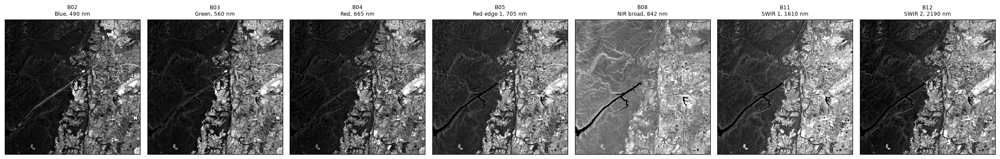

In [19]:
order = [b for b in ["B02", "B03", "B04", "B05", "B08", "B11", "B12"] if b in scene]
fig, axes = plt.subplots(1, len(order), figsize=(3.0 * len(order), 3.4))
for ax, b in zip(np.atleast_1d(axes), order):
    band = next(x for x in E.BANDS if x.sid == b)
    arr = scene[b].astype("float32")
    lo, hi = np.nanpercentile(arr, [2, 98])
    ax.imshow(arr, cmap="gray", vmin=lo, vmax=hi)
    ax.set_title(f"{b}\n{band.role}, {band.wavelength_nm} nm", fontsize=8)
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout(); plt.show()

## 5. Composites

A "true colour" image is just three chosen bands mapped to the display's red, green and blue
channels. Choose different bands and you get a **false colour** composite, which is often far
more informative. The classic is NIR-Red-Green: healthy vegetation blazes red, water is black,
bare ground is cyan-grey.

Note the contrast stretch. Raw satellite data is dark and low-contrast because the scale is
built for bright surfaces like cloud and snow. Stretching is a *display* operation only —
never stretch before computing an index.

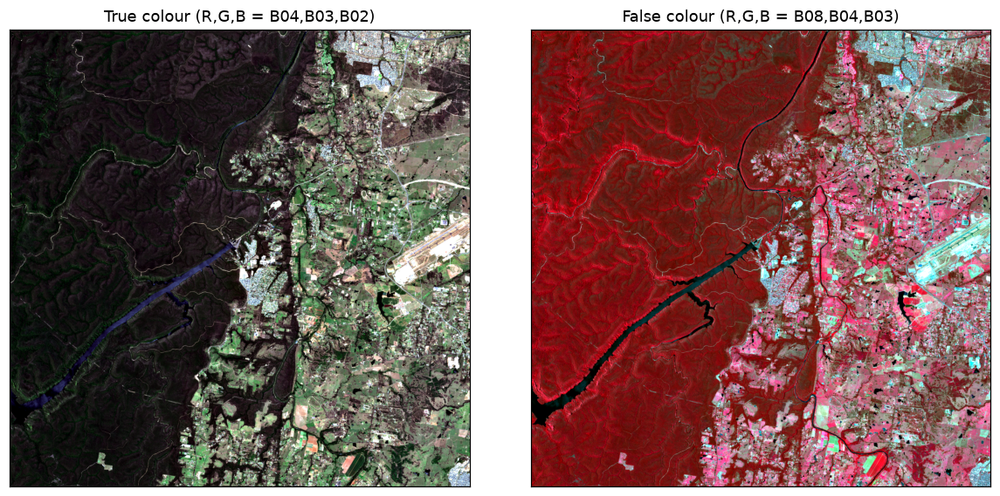

In [20]:
def composite(scene, bands, pct=(2, 98)):
    stack = np.dstack([scene[b].astype("float32") for b in bands])
    out = np.zeros_like(stack)
    for i in range(3):
        lo, hi = np.nanpercentile(stack[..., i], pct)
        out[..., i] = np.clip((stack[..., i] - lo) / max(hi - lo, 1e-9), 0, 1)
    return out

fig, (a1, a2) = plt.subplots(1, 2, figsize=(11, 5.2))
a1.imshow(composite(scene, ["B04", "B03", "B02"])); a1.set_title("True colour (R,G,B = B04,B03,B02)")
a2.imshow(composite(scene, ["B08", "B04", "B03"])); a2.set_title("False colour (R,G,B = B08,B04,B03)")
for a in (a1, a2): a.set_xticks([]); a.set_yticks([])
plt.tight_layout(); plt.show()

## 6. The reflectance trap

This is the most important section in the notebook.

Sentinel-2 Level-2A does not store surface reflectance. It stores **integers**, from which
reflectance is recovered as

$$\rho = \frac{\mathrm{DN} + \text{offset}}{\text{scale}}, \qquad \text{scale}=10\,000$$

For products generated under **processing baseline 04.00 and later** — everything since
25 January 2022 — the offset is $-1000$. Before that, there was no offset.

Now the trap. Skipping this conversion does *not* produce an obviously broken map. It produces
a plausible one. Two separate things go wrong, and they go wrong for different reasons.

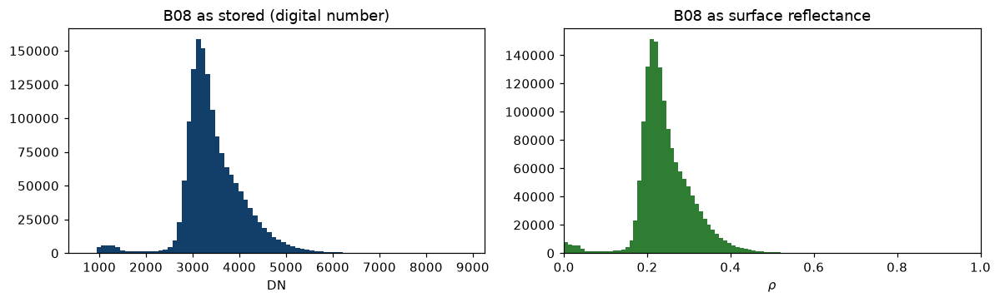

stored integers :      737 to     8848
reflectance     :    0.000 to    0.785


In [21]:
nir_dn, red_dn = scene["B08"].astype("float32"), scene["B04"].astype("float32")
nir_rf, red_rf = E.to_reflectance(nir_dn), E.to_reflectance(red_dn)

fig, (a1, a2) = plt.subplots(1, 2, figsize=(11, 3.4))
a1.hist(nir_dn.ravel(), bins=80, color="#123F69"); a1.set_title("B08 as stored (digital number)")
a1.set_xlabel("DN")
a2.hist(nir_rf.ravel(), bins=80, color="#2E7D32"); a2.set_title("B08 as surface reflectance")
a2.set_xlabel(r"$\rho$"); a2.set_xlim(0, 1)
plt.tight_layout(); plt.show()

print(f"stored integers : {nir_dn.min():8.0f} to {nir_dn.max():8.0f}")
print(f"reflectance     : {nir_rf.min():8.3f} to {nir_rf.max():8.3f}")

### Failure 1 — SAVI stops being SAVI

The Soil-Adjusted Vegetation Index adds a constant $L$ to the denominator to suppress the
soil background:

$$\text{SAVI} = (1+L)\,\frac{\rho_{N}-\rho_{R}}{\rho_{N}+\rho_{R}+L}, \qquad L = 0.5$$

$L$ is measured in **reflectance units**. Against values in the thousands it is nothing, so
the whole term vanishes and SAVI collapses to $(1+L) \times \text{NDVI}$. The map still looks
like a vegetation map. It just isn't soil-adjusted, and you have no way of telling by eye.

### Failure 2 — even NDVI is not safe

You will often be told that NDVI is "scale-free, so the conversion doesn't matter". Half true.
A normalised difference is invariant to a **multiplicative** rescaling:

$$\frac{ka - kb}{ka + kb} = \frac{a-b}{a+b}$$

but it is **not** invariant to an **additive** offset:

$$\frac{(a+c) - (b+c)}{(a+c)+(b+c)} = \frac{a-b}{a+b+2c} \neq \frac{a-b}{a+b}$$

Baseline 04.00 introduced exactly such an offset. So on any scene processed since January 2022,
NDVI-on-integers and NDVI-on-reflectance are different numbers.

Run the cell. Both failures are quantified.

In [22]:
_ = E.savi_scaling_demo()

Lesson 1: SAVI on digital numbers is NDVI in disguise
----------------------------------------------------------
  median( SAVI_DN / NDVI_DN )       = 1.499884
  (1 + L)                           = 1.500000
  max | SAVI_DN - (1+L)*NDVI_DN |   = 8.31e-05
  mean | SAVI_right - SAVI_wrong |  = 0.2038

Lesson 2: an additive offset survives a normalised difference
----------------------------------------------------------
  mean | NDVI_reflectance - NDVI_DN | = 0.2233
  max  | NDVI_reflectance - NDVI_DN | = 0.9483

  NDVI is invariant to a multiplicative rescaling, so it survives
  the 1/10000. It is NOT invariant to the baseline 04.00 offset of
  -1000, so 'NDVI is scale-free, I can skip the conversion' is wrong.


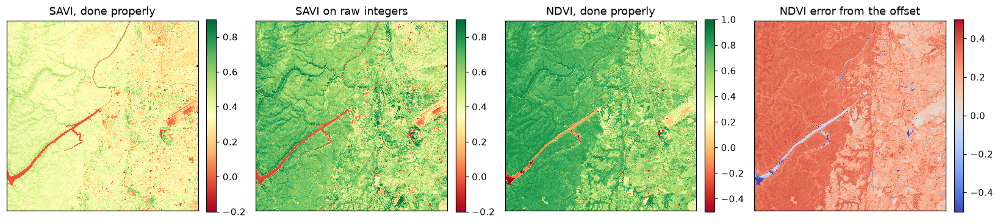

mean |NDVI difference| = 0.2727
Panels 1 and 2 are not the same index. Panels 3 and 4 are the same index, computed two ways.


In [23]:
# See it, don't just read it.
savi_right = E.savi(nir_rf, red_rf, L=0.5)
savi_wrong = E.savi(nir_dn, red_dn, L=0.5)
ndvi_right = E.ndvi(nir_rf, red_rf)
ndvi_wrong = E.ndvi(nir_dn, red_dn)

fig, axes = plt.subplots(1, 4, figsize=(15, 3.8))
E.show_index(savi_right, "SAVI, done properly", ax=axes[0], vmin=-0.2, vmax=0.9)
E.show_index(savi_wrong, "SAVI on raw integers", ax=axes[1], vmin=-0.2, vmax=0.9)
E.show_index(ndvi_right, "NDVI, done properly", ax=axes[2], vmin=-0.5, vmax=1.0)
E.show_index(ndvi_right - ndvi_wrong, "NDVI error from the offset",
             cmap="coolwarm", ax=axes[3], vmin=-0.5, vmax=0.5)
plt.tight_layout(); plt.show()

print(f"mean |NDVI difference| = {np.nanmean(np.abs(ndvi_right - ndvi_wrong)):.4f}")
print("Panels 1 and 2 are not the same index. Panels 3 and 4 are the same index, "
      "computed two ways.")

> **A habit worth forming.** `esgsat` records, for every index, whether it needs true
> reflectance. `compute_index()` warns if you hand it raw integers. Build that check into your
> own code: a silent assumption is the one that survives peer review.

In [24]:
# The guard, demonstrated.
with warnings.catch_warnings(record=True) as caught:
    warnings.simplefilter("always")
    _ = E.compute_index("SAVI", scene, reflectance=False)
    for wmsg in caught:
        print(f"WARNING: {wmsg.message}")

# From here on, everything is in reflectance.
rf = {b: E.to_reflectance(scene[b]) for b in scene if b != "SCL"}
rf["SCL"] = scene["SCL"]
print("\nAll bands converted. Proceeding in reflectance.")


All bands converted. Proceeding in reflectance.


## 7. Cloud and shadow

Level-2A ships a per-pixel **scene classification layer**. Filtering on it is one line, and it
is the line most tutorials leave out. Unmasked cloud reads as bright, cold and non-vegetated,
which drags every index you compute toward the wrong answer — and it does so *systematically*,
because cloud is not randomly distributed over a landscape.

In [25]:
scl = rf["SCL"]
present = sorted(int(c) for c in np.unique(scl))
print("Scene classification classes present:")
for c in present:
    frac = float(np.mean(scl == c))
    keep = "keep" if c in E.SCL_KEEP_DEFAULT else "DROP"
    print(f"  {c:2d}  {E.SCL_CLASSES.get(c, 'unknown'):28s} {frac*100:5.1f}%   {keep}")

mask = E.scl_mask(scl)
print(f"\nUsable fraction of the scene: {float(mask.mean())*100:.1f}%")

nd = E.ndvi(rf["B08"], rf["B04"])
nd_masked = np.where(mask, nd, np.nan)
print(f"mean NDVI, unmasked = {np.nanmean(nd):.4f}")
print(f"mean NDVI, masked   = {np.nanmean(nd_masked):.4f}")
print(f"difference          = {np.nanmean(nd) - np.nanmean(nd_masked):+.4f}")

Scene classification classes present:
   2  Dark area / cast shadow        0.4%   DROP
   4  Vegetation                    88.6%   keep
   5  Not vegetated                  9.4%   keep
   6  Water                          1.3%   keep
   7  Unclassified                   0.4%   keep
  10  Thin cirrus                    0.0%   DROP

Usable fraction of the scene: 99.6%
mean NDVI, unmasked = 0.6437
mean NDVI, masked   = 0.6448
difference          = -0.0011


## 8. The index sweep

Sixteen indices, one scene, one loop. This is the "index zoo" from the lecture made concrete:
they are all hand-crafted features, each a fixed low-dimensional summary of the same spectrum,
each encoding somebody's physical hypothesis about what matters.

Read the panel as a set of *hypotheses about the landscape*, not as sixteen answers.

Computing 16 of 16 registered indices (the rest need bands we did not load).



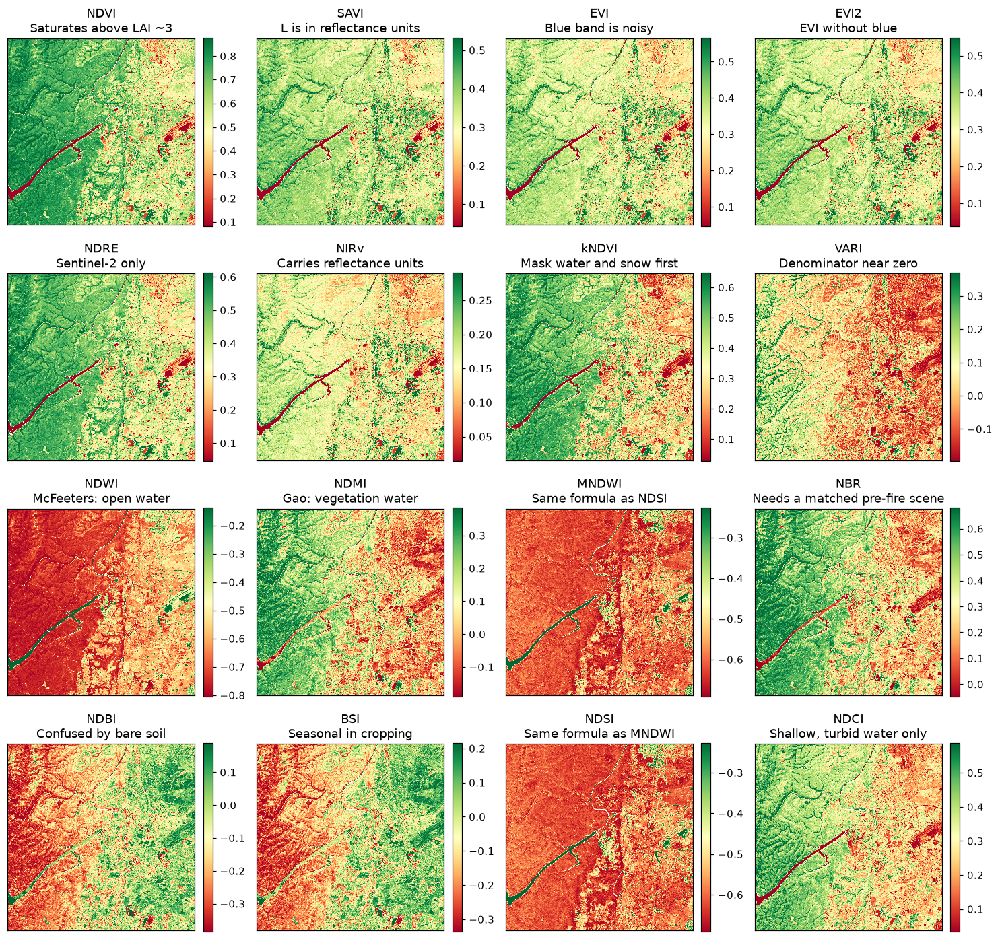

In [26]:
available = {k: v for k, v in E.INDEX_REGISTRY.items()
             if all(b in rf for b in v.bands)}
print(f"Computing {len(available)} of {len(E.INDEX_REGISTRY)} registered indices "
      f"(the rest need bands we did not load).\n")

ncol = 4
nrow = int(np.ceil(len(available) / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(3.4 * ncol, 3.2 * nrow))
axes = np.atleast_1d(axes).ravel()
results = {}
for ax, (name, spec) in zip(axes, available.items()):
    vals = np.where(mask, E.compute_index(name, rf), np.nan)
    results[name] = vals
    E.show_index(vals, f"{name}\n{spec.note}", ax=ax)
for ax in axes[len(available):]:
    ax.axis("off")
plt.tight_layout(); plt.show()

In [27]:
print(f"{'index':7s} {'min':>8s} {'median':>8s} {'max':>8s}   {'bands':<22s} reflectance?")
print("-" * 76)
for name, vals in results.items():
    spec = E.INDEX_REGISTRY[name]
    print(f"{name:7s} {np.nanmin(vals):8.3f} {np.nanmedian(vals):8.3f} {np.nanmax(vals):8.3f}"
          f"   {','.join(spec.bands):<22s} {'required' if spec.needs_reflectance else 'no'}")

index        min   median      max   bands                  reflectance?
----------------------------------------------------------------------------
NDVI      -1.000    0.701    0.984   B08,B04                no
SAVI      -0.303    0.364    0.796   B08,B04                required
EVI       -4.000    0.358  117.445   B08,B04,B02            required
EVI2      -0.249    0.352    0.908   B08,B04                required
NDRE      -1.000    0.464    1.000   B08,B05                no
NIRv      -0.040    0.160    0.622   B08,B04                required
kNDVI      0.000    0.456    0.762   B08,B04                no
VARI      -1.082    0.025    1.120   B03,B04,B02            no
NDWI      -1.000   -0.695    1.000   B03,B08                no
NDMI      -1.000    0.131    0.733   B08,B11                no
MNDWI     -1.000   -0.609    0.887   B03,B11                no
NBR       -1.000    0.413    0.832   B08,B12                no
NDBI      -0.733   -0.131    1.000   B11,B08                no
BSI    

## 9. The feature space

An index is a feature. Two indices define a plane, and land-cover types occupy different
regions of it. This scatter is the clearest picture of *why* index-based classification works
at all — and of where it stops working, in the region where the clusters overlap.

Everything a pixel classifier does is draw boundaries in a space like this one, with more
dimensions.

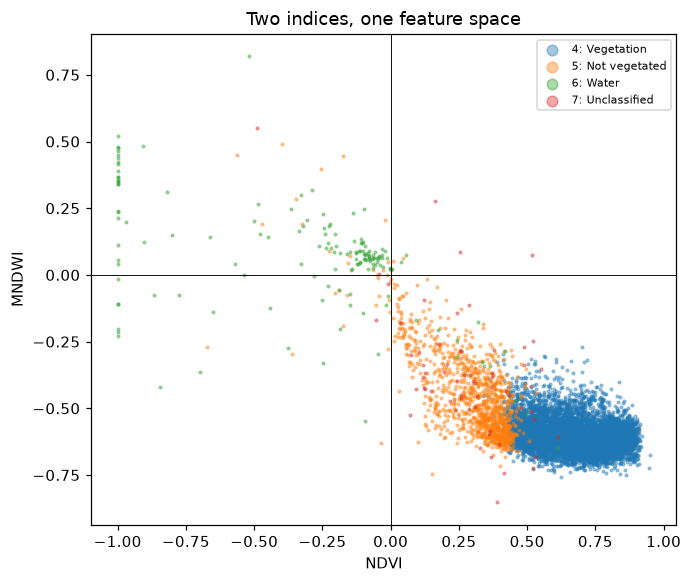

In [28]:
x = E.ndvi(rf["B08"], rf["B04"])
y = E.mndwi(rf["B03"], rf["B11"])
ok = mask & np.isfinite(x) & np.isfinite(y)

idx = np.flatnonzero(ok.ravel())
rng = np.random.default_rng(25881)
sub = rng.choice(idx, size=min(12000, idx.size), replace=False)

classes = scl.ravel()[sub]
fig, ax = plt.subplots(figsize=(6.4, 5.4))
for c in sorted(set(int(v) for v in classes)):
    sel = classes == c
    ax.scatter(x.ravel()[sub][sel], y.ravel()[sub][sel], s=3, alpha=0.4,
               label=f"{c}: {E.SCL_CLASSES.get(c, '?')}")
ax.axhline(0, lw=0.6, color="k"); ax.axvline(0, lw=0.6, color="k")
ax.set_xlabel("NDVI"); ax.set_ylabel("MNDWI")
ax.set_title("Two indices, one feature space")
ax.legend(markerscale=4, fontsize=7, loc="upper right")
plt.tight_layout(); plt.show()

## 10. Breaking three indices on purpose

Knowing an index is easy. Knowing when it lies to you is the skill.

**(a) Saturation.** NDVI stops responding above a leaf area index of about 3 — exactly the
regime that matters for forest carbon. kNDVI and NIRv were built to push that ceiling back.

**(b) An identity nobody mentions.** MNDWI (water) and NDSI (snow) are *algebraically the same
formula*. They differ only in the threshold applied and the context assumed. An index is not a
detector until someone chooses a cut-off — and that choice is a modelling decision that is
almost never documented.

**(c) A denominator that goes to zero.** VARI divides by $\rho_G + \rho_R - \rho_B$, which can
approach zero over bright or blue-dominated surfaces, producing enormous values that will
wreck any downstream statistic you compute.

C:\Users\Vitali\AppData\Local\Temp\ipykernel_3200\719415710.py:25: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(); plt.show()


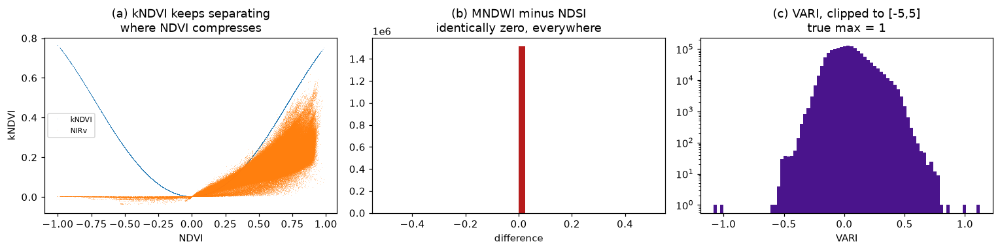

MNDWI and NDSI identical: True
VARI values beyond [-2, 2]: 0.00% of pixels


In [29]:
# (a) saturation
nd_v = E.ndvi(rf["B08"], rf["B04"])[mask]
kn_v = E.kndvi(rf["B08"], rf["B04"])[mask]
nv_v = E.nirv(rf["B08"], rf["B04"])[mask]
o = np.argsort(nd_v)
fig, (a1, a2, a3) = plt.subplots(1, 3, figsize=(14, 3.6))
a1.plot(nd_v[o], kn_v[o], ",", alpha=0.3); a1.set_xlabel("NDVI"); a1.set_ylabel("kNDVI")
a1.set_title("(a) kNDVI keeps separating\nwhere NDVI compresses")
a1.plot(nd_v[o], nv_v[o], ",", alpha=0.3, color="C1")
a1.legend(["kNDVI", "NIRv"], fontsize=7)

# (b) the identity
mw = E.mndwi(rf["B03"], rf["B11"]); ns = E.ndsi(rf["B03"], rf["B11"])
a2.hist((mw - ns).ravel(), bins=40, color="#B71C1C")
a2.set_title("(b) MNDWI minus NDSI\nidentically zero, everywhere")
a2.set_xlabel("difference")

# (c) the blow-up
va = E.vari(rf["B03"], rf["B04"], rf["B02"])
finite = va[np.isfinite(va)]
a3.hist(np.clip(finite, -5, 5), bins=80, color="#4A148C")
a3.set_yscale("log")
a3.set_title(f"(c) VARI, clipped to [-5,5]\ntrue max = {np.nanmax(finite):,.0f}")
a3.set_xlabel("VARI")
plt.tight_layout(); plt.show()

print(f"MNDWI and NDSI identical: {np.allclose(mw[np.isfinite(mw)], ns[np.isfinite(ns)])}")
print(f"VARI values beyond [-2, 2]: {float(np.mean(np.abs(finite) > 2)) * 100:.2f}% of pixels")

## Core exercises

Do all three. They are short.

**C1 — Prove the invariance claim yourself.** Write two assertions: one showing NDVI is
unchanged when both bands are multiplied by an arbitrary constant, one showing it *is* changed
when a constant is added to both. State, in one sentence, which of these the Sentinel-2 scaling
convention actually does to you.

**C2 — Quantify the cost of skipping the mask.** Recompute the mean of any three indices with
and without the SCL mask. Report the differences. Then answer the harder question: is the bias
you found in a consistent direction, and why would that matter for a time series?

**C3 — Pick a fourth index to break.** Choose any index in `E.INDEX_REGISTRY` that we did not
break in section 10. Find a condition under which it misleads, demonstrate it on this scene or
on `E.demo_scene()`, and write two sentences on when you would not use it.

## Stretch exercises

**S1 — A different area, a different conclusion.** Re-run the whole notebook over
`hunter-valley` or `port-kembla`. Which indices become informative that were not, and which
become useless? Relate your answer to what is physically on the ground.

**S2 — Build the soil line.** Scatter NIR against red for the bare-soil pixels only
(`SCL == 5`). Fit a line. That line is what SAVI's $L$ parameter is compensating for. Estimate
an $L$ appropriate to *your* scene and compare the resulting SAVI map to the $L = 0.5$ default.

**S3 — Make the threshold explicit.** Section 10(b) showed MNDWI and NDSI are the same formula.
Derive a water mask from MNDWI using three different thresholds, and report the surface water
area each implies, in hectares. You have just produced three different answers to a question a
client would consider factual. Which would you report, and what would you say alongside it?

**S4 — Cloud, honestly.** Compare the scene-level `eo:cloud_cover` from the STAC metadata with
the cloud fraction you compute from the SCL over your actual bounding box. Explain the gap.

## Taking this to Assessment 2

Three things from this notebook belong in a case study, whatever your topic.

1. **State your data provenance.** Collection, processing baseline, date, and the exact
   transformation from stored values to physical units. "Sentinel-2 imagery" is not provenance.
2. **State what you masked and what you lost.** A usable-pixel fraction is a result, not a
   footnote. If it is 40 per cent, your conclusion is about 40 per cent of the landscape.
3. **State the failure mode.** Every index has one. An analysis that names it is more credible
   than one that reports a higher accuracy.

The next notebook, **08b**, takes the features built here and pushes them the rest of the way:
from an index, to hectares, to tonnes of CO₂, to a dollar value — and asks how much of that
chain survives contact with its own uncertainty.